# DecisionTree implementation with all possible data 

In [1]:
# imports
from sklearn.tree import DecisionTreeClassifier, export_graphviz
from sklearn.model_selection import GridSearchCV
import importlib.util
spec = importlib.util.spec_from_file_location("module.name", "../functions.py")
functions = importlib.util.module_from_spec(spec)
spec.loader.exec_module(functions)
from sklearn.model_selection import train_test_split
from sklearn.metrics import f1_score, accuracy_score
import pandas as pd
from sklearn.metrics import confusion_matrix
import numpy as np

# param values
criterion = ['entropy']
max_depth = list(range(1, 50, 1)) + list(range(20, 110, 10))
splitter = ['best', 'random']
min_samples_split = list(range(2, 16, 2))
max_features = ['auto', 'sqrt', 'log2', None]
# creating  grid instance
params = dict(criterion=criterion, max_depth=max_depth, splitter=splitter, min_samples_split=min_samples_split,
              max_features=max_features)

In [2]:
import matplotlib.pyplot as plt
import itertools
def plot_confusion_matrix(cm, classes,
                          normalize=False,
                          title='Confusion matrix',
                          cmap=plt.cm.Blues):
    """
    This function prints and plots the confusion matrix.
    Normalization can be applied by setting `normalize=True`.
    """
    plt.imshow(cm, interpolation='nearest', cmap=cmap)
    plt.title(title)
    plt.colorbar()
    tick_marks = np.arange(len(classes))
    plt.xticks(tick_marks, classes, rotation=45)
    plt.yticks(tick_marks, classes)

    fmt = '.2f' if normalize else 'd'
    thresh = cm.max() / 2.
    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        plt.text(j, i, format(cm[i, j], fmt),
                 horizontalalignment="center",
                 color="white" if cm[i, j] > thresh else "black")

    plt.ylabel('True label')
    plt.xlabel('Predicted label')
    plt.tight_layout()

## DecisionTree with just using default values

In [3]:
# get data
X, y = functions.get_data(type="_new")
# split dataset into train and test data
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25, random_state=10, stratify=y)

In [4]:
clf = DecisionTreeClassifier()
clf.fit(X_train, y_train.values.ravel())

DecisionTreeClassifier(class_weight=None, criterion='gini', max_depth=None,
            max_features=None, max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=1, min_samples_split=2,
            min_weight_fraction_leaf=0.0, presort=False, random_state=None,
            splitter='best')

In [5]:
# predict test values
y_pred_basic = clf.predict(X_test)

In [6]:
# calculate F1 score
f1_basic = f1_score(y_test, y_pred_basic)
"F1 score is = {0}".format(f1_basic)

'F1 score is = 0.25912137006701413'

In [7]:
# creating KNN instance
clf = DecisionTreeClassifier()
clfCV = GridSearchCV(clf, params, cv=10, scoring='recall', verbose=10, n_jobs=-1, refit=True)

clfCV.fit(X_train, y_train.values.ravel())

Fitting 10 folds for each of 3248 candidates, totalling 32480 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done   5 tasks      | elapsed:    1.1s
[Parallel(n_jobs=-1)]: Done  10 tasks      | elapsed:    1.1s
[Parallel(n_jobs=-1)]: Done  17 tasks      | elapsed:    1.2s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.1801s.) Setting batch_size=2.
[Parallel(n_jobs=-1)]: Done  24 tasks      | elapsed:    1.2s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0904s.) Setting batch_size=8.
[Parallel(n_jobs=-1)]: Done  38 tasks      | elapsed:    1.3s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.1920s.) Setting batch_size=16.
[Parallel(n_jobs=-1)]: Done  92 tasks      | elapsed:    1.7s
[Parallel(n_jobs=-1)]: Done 252 tasks      | elapsed:    2.7s
[Parallel(n_jobs=-1)]: Done 428 tasks      | elapsed:    4.0s
[Parallel(n_jobs=-1)]: Done 636 tasks      | elapsed:    5.7s
[Parallel(n_jobs=-1)]: Done 844 tasks      | elapsed:    7.3s
[Parallel(n_jobs=-1)]: Done 1084 tasks      | elapsed:

[Parallel(n_jobs=-1)]: Done 19496 tasks      | elapsed: 11.0min
[Parallel(n_jobs=-1)]: Done 19750 tasks      | elapsed: 11.2min
[Parallel(n_jobs=-1)]: Done 20004 tasks      | elapsed: 11.4min
[Parallel(n_jobs=-1)]: Done 20262 tasks      | elapsed: 11.6min
[Parallel(n_jobs=-1)]: Done 20520 tasks      | elapsed: 11.8min
[Parallel(n_jobs=-1)]: Done 20782 tasks      | elapsed: 12.1min
[Parallel(n_jobs=-1)]: Done 21044 tasks      | elapsed: 12.2min
[Parallel(n_jobs=-1)]: Done 21310 tasks      | elapsed: 12.5min
[Parallel(n_jobs=-1)]: Done 21576 tasks      | elapsed: 12.6min
[Parallel(n_jobs=-1)]: Done 21846 tasks      | elapsed: 12.9min
[Parallel(n_jobs=-1)]: Done 22116 tasks      | elapsed: 13.0min
[Parallel(n_jobs=-1)]: Done 22390 tasks      | elapsed: 13.3min
[Parallel(n_jobs=-1)]: Done 22664 tasks      | elapsed: 13.4min
[Parallel(n_jobs=-1)]: Done 22942 tasks      | elapsed: 13.7min
[Parallel(n_jobs=-1)]: Done 23220 tasks      | elapsed: 13.9min
[Parallel(n_jobs=-1)]: Done 23502 tasks 

GridSearchCV(cv=10, error_score='raise-deprecating',
       estimator=DecisionTreeClassifier(class_weight=None, criterion='gini', max_depth=None,
            max_features=None, max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=1, min_samples_split=2,
            min_weight_fraction_leaf=0.0, presort=False, random_state=None,
            splitter='best'),
       fit_params=None, iid='warn', n_jobs=-1,
       param_grid={'splitter': ['best', 'random'], 'criterion': ['entropy'], 'max_depth': [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 20, 30, 40, 50, 60, 70, 80, 90, 100], 'min_samples_split': [2, 4, 6, 8, 10, 12, 14], 'max_features': ['auto', 'sqrt', 'log2', None]},
       pre_dispatch='2*n_jobs', refit=True, return_train_score='warn',
       scoring='recall', verbose=10)

In [8]:
clf = clfCV.best_estimator_
clf.fit(X_train, y_train.values.ravel())
# predict test values
y_pred_basic = clf.predict(X_test)
# calculate F1 score
f1_basic = f1_score(y_test, y_pred_basic)
print("F1 score is = {0}".format(f1_basic))
print("Accuracy is = {0}".format(accuracy_score(y_test, y_pred_basic)))

F1 score is = 0.2672249714503236
Accuracy is = 0.776604386677498


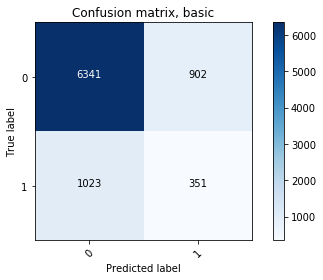

In [9]:
cm_basis = confusion_matrix(y_test, y_pred_basic)


np.set_printoptions(precision=2)

plt.figure()
plot_confusion_matrix(cm_basis, classes=['0','1'],
                      title='Confusion matrix, basic')
plt.show()

In [10]:
from IPython.display import SVG
from graphviz import Source
from IPython.display import display
labels = X.columns

graph = Source(export_graphviz(clf, out_file=None
   , feature_names=labels, class_names=['0', '1'] 
   , filled = True))

display(SVG(graph.pipe(format='svg')))

## DecisionTree with removed outliers

In [11]:
# get data
X, y = functions.get_data(type="__removeoutliers_new")
# split dataset into train and test data
X_train, X_test, y_train, y_test_outliers = train_test_split(X, y, test_size=0.25, random_state=10, stratify=y)
# (7983, 1)
X_test.shape

(6399, 36)

In [12]:
clf = DecisionTreeClassifier()
clf.fit(X_train, y_train.values.ravel())

DecisionTreeClassifier(class_weight=None, criterion='gini', max_depth=None,
            max_features=None, max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=1, min_samples_split=2,
            min_weight_fraction_leaf=0.0, presort=False, random_state=None,
            splitter='best')

In [13]:
# predict test values
y_pred_outliers = clf.predict(X_test)

In [14]:
# calculate F1 score
# calculate F1 score
f1_outliers = f1_score(y_test_outliers, y_pred_outliers)
"F1 score is = {0}".format(f1_outliers)

'F1 score is = 0.2923001471309465'

In [15]:
# creating KNN instance
clf = DecisionTreeClassifier()
clfCV = GridSearchCV(clf, params, cv=10, scoring='recall', verbose=10, n_jobs=-1, refit=True)

clfCV.fit(X_train, y_train.values.ravel())

Fitting 10 folds for each of 3248 candidates, totalling 32480 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0480s.) Setting batch_size=8.
[Parallel(n_jobs=-1)]: Done   5 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done  24 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done  80 tasks      | elapsed:    0.6s
[Parallel(n_jobs=-1)]: Done 136 tasks      | elapsed:    0.9s
[Parallel(n_jobs=-1)]: Done 208 tasks      | elapsed:    1.2s
[Parallel(n_jobs=-1)]: Done 280 tasks      | elapsed:    1.5s
[Parallel(n_jobs=-1)]: Done 368 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done 456 tasks      | elapsed:    2.5s
[Parallel(n_jobs=-1)]: Done 560 tasks      | elapsed:    3.4s
[Parallel(n_jobs=-1)]: Done 664 tasks      | elapsed:    4.0s
[Parallel(n_jobs=-1)]: Done 784 tasks      | elapsed:    4.7s
[Parallel(n_jobs=-1)]: Done 904 tasks      | elapsed:    5.3s
[Parallel(n_jobs=-1)]: Done 1040 tasks      | elapsed:    6.5s
[Parallel(n_jobs=-1)]: Done 1176 t

[Parallel(n_jobs=-1)]: Done 20652 tasks      | elapsed:  8.7min
[Parallel(n_jobs=-1)]: Done 20902 tasks      | elapsed:  8.9min
[Parallel(n_jobs=-1)]: Done 21152 tasks      | elapsed:  9.0min
[Parallel(n_jobs=-1)]: Done 21406 tasks      | elapsed:  9.2min
[Parallel(n_jobs=-1)]: Done 21660 tasks      | elapsed:  9.2min
[Parallel(n_jobs=-1)]: Done 21918 tasks      | elapsed:  9.5min
[Parallel(n_jobs=-1)]: Done 22176 tasks      | elapsed:  9.5min
[Parallel(n_jobs=-1)]: Done 22438 tasks      | elapsed:  9.8min
[Parallel(n_jobs=-1)]: Done 22700 tasks      | elapsed:  9.8min
[Parallel(n_jobs=-1)]: Done 22966 tasks      | elapsed: 10.1min
[Parallel(n_jobs=-1)]: Done 23232 tasks      | elapsed: 10.1min
[Parallel(n_jobs=-1)]: Done 23502 tasks      | elapsed: 10.3min
[Parallel(n_jobs=-1)]: Done 23772 tasks      | elapsed: 10.4min
[Parallel(n_jobs=-1)]: Done 24046 tasks      | elapsed: 10.6min
[Parallel(n_jobs=-1)]: Done 24320 tasks      | elapsed: 10.8min
[Parallel(n_jobs=-1)]: Done 24598 tasks 

GridSearchCV(cv=10, error_score='raise-deprecating',
       estimator=DecisionTreeClassifier(class_weight=None, criterion='gini', max_depth=None,
            max_features=None, max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=1, min_samples_split=2,
            min_weight_fraction_leaf=0.0, presort=False, random_state=None,
            splitter='best'),
       fit_params=None, iid='warn', n_jobs=-1,
       param_grid={'splitter': ['best', 'random'], 'criterion': ['entropy'], 'max_depth': [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 20, 30, 40, 50, 60, 70, 80, 90, 100], 'min_samples_split': [2, 4, 6, 8, 10, 12, 14], 'max_features': ['auto', 'sqrt', 'log2', None]},
       pre_dispatch='2*n_jobs', refit=True, return_train_score='warn',
       scoring='recall', verbose=10)

In [16]:
clf = clfCV.best_estimator_
clf.fit(X_train, y_train.values.ravel())
# predict test values
y_pred_outliers = clf.predict(X_test)

# calculate F1 score
f1_outliers = f1_score(y_test_outliers, y_pred_outliers)
print("F1 score is = {0}".format(f1_outliers))
print("Accuracy is = {0}".format(accuracy_score(y_test_outliers, y_pred_outliers)))

F1 score is = 0.2720883534136546
Accuracy is = 0.7734020940771995


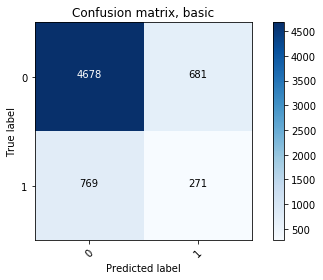

In [17]:
cm_basis = confusion_matrix(y_test_outliers, y_pred_outliers)


np.set_printoptions(precision=2)

plt.figure()
plot_confusion_matrix(cm_basis, classes=['0','1'],
                      title='Confusion matrix, basic')
plt.show()

In [18]:
labels = X.columns

graph = Source(export_graphviz(clf, out_file=None
   , feature_names=labels, class_names=['0', '1'] 
   , filled = True))

display(SVG(graph.pipe(format='svg')))

## DecisionTree with PCA features

In [19]:
# get data
X, y = functions.get_data(type="__PCA_new")
# split dataset into train and test data
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25, random_state=10, stratify=y)

In [20]:
clf = DecisionTreeClassifier()
clf.fit(X_train, y_train.values.ravel())

DecisionTreeClassifier(class_weight=None, criterion='gini', max_depth=None,
            max_features=None, max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=1, min_samples_split=2,
            min_weight_fraction_leaf=0.0, presort=False, random_state=None,
            splitter='best')

In [21]:
# predict test values
y_pred_PCA = clf.predict(X_test)

In [22]:
# calculate F1 score
f1_PCA = f1_score(y_test, y_pred_PCA)
"F1 score is = {0}".format(f1_PCA)

'F1 score is = 1.0'

In [23]:
# creating KNN instance
clf = DecisionTreeClassifier()
clfCV = GridSearchCV(clf, params, cv=10, scoring='recall', verbose=10, n_jobs=-1, refit=True)

clfCV.fit(X_train, y_train.values.ravel())

Fitting 10 folds for each of 3248 candidates, totalling 32480 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Batch computation too fast (0.1030s.) Setting batch_size=2.
[Parallel(n_jobs=-1)]: Done   5 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.1101s.) Setting batch_size=6.
[Parallel(n_jobs=-1)]: Done  12 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.1601s.) Setting batch_size=14.
[Parallel(n_jobs=-1)]: Done  34 tasks      | elapsed:    0.5s
[Parallel(n_jobs=-1)]: Done  84 tasks      | elapsed:    1.0s
[Parallel(n_jobs=-1)]: Done 210 tasks      | elapsed:    2.2s
[Parallel(n_jobs=-1)]: Done 336 tasks      | elapsed:    3.0s
[Parallel(n_jobs=-1)]: Done 490 tasks      | elapsed:    6.0s
[Parallel(n_jobs=-1)]: Batch computation too slow (2.1268s.) Setting batch_size=7.
[Parallel(n_jobs=-1)]: Done 630 tasks      | elapsed:    8.0s
[Parallel(n_jobs=-1)]: Done 721 tasks      | elapsed:    9.1s
[Parallel(n_jobs=-1)]: Done 812 t

GridSearchCV(cv=10, error_score='raise-deprecating',
       estimator=DecisionTreeClassifier(class_weight=None, criterion='gini', max_depth=None,
            max_features=None, max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=1, min_samples_split=2,
            min_weight_fraction_leaf=0.0, presort=False, random_state=None,
            splitter='best'),
       fit_params=None, iid='warn', n_jobs=-1,
       param_grid={'splitter': ['best', 'random'], 'criterion': ['entropy'], 'max_depth': [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 20, 30, 40, 50, 60, 70, 80, 90, 100], 'min_samples_split': [2, 4, 6, 8, 10, 12, 14], 'max_features': ['auto', 'sqrt', 'log2', None]},
       pre_dispatch='2*n_jobs', refit=True, return_train_score='warn',
       scoring='recall', verbose=10)

In [24]:
clf = clfCV.best_estimator_
clf.fit(X_train, y_train.values.ravel())
# predict test values
y_pred_PCA = clf.predict(X_test)

# calculate F1 score
f1_PCA = f1_score(y_test, y_pred_PCA)
print("F1 score is = {0}".format(f1_PCA))
print("Accuracy is = {0}".format(accuracy_score(y_test, y_pred_PCA)))

F1 score is = 0.908802537668517
Accuracy is = 0.9733085760705582


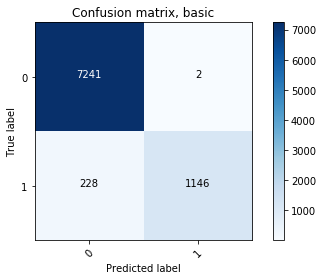

In [25]:
cm_basis = confusion_matrix(y_test, y_pred_PCA)


np.set_printoptions(precision=2)

plt.figure()
plot_confusion_matrix(cm_basis, classes=['0','1'],
                      title='Confusion matrix, basic')
plt.show()

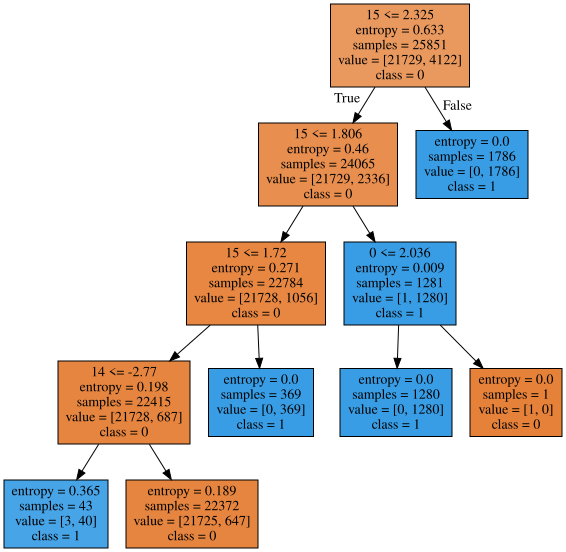

In [26]:
labels = X.columns

graph = Source(export_graphviz(clf, out_file=None
   , feature_names=labels, class_names=['0', '1'] 
   , filled = True))

display(SVG(graph.pipe(format='svg')))

## DecisionTree with feature tools features

In [27]:
# get data
X, y = functions.get_data(type="__FTs_new")
# split dataset into train and test data
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.33, random_state=10, stratify=y)

In [28]:
clf = DecisionTreeClassifier()
clf.fit(X_train, y_train.values.ravel())

DecisionTreeClassifier(class_weight=None, criterion='gini', max_depth=None,
            max_features=None, max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=1, min_samples_split=2,
            min_weight_fraction_leaf=0.0, presort=False, random_state=None,
            splitter='best')

In [29]:
# predict test values
y_pred_FT = clf.predict(X_test)

In [30]:
# calculate F1 score
f1_FT = f1_score(y_test, y_pred_FT)
"F1 score is = {0}".format(f1_FT)

'F1 score is = 0.2439872500724428'

In [31]:
# creating KNN instance
clf = DecisionTreeClassifier()
clfCV = GridSearchCV(clf, params, cv=10, scoring='recall', verbose=10, n_jobs=-1, refit=True)

clfCV.fit(X_train, y_train.values.ravel())

Fitting 10 folds for each of 3248 candidates, totalling 32480 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0798s.) Setting batch_size=4.
[Parallel(n_jobs=-1)]: Done   5 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.1171s.) Setting batch_size=12.
[Parallel(n_jobs=-1)]: Done  16 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done  52 tasks      | elapsed:    0.5s
[Parallel(n_jobs=-1)]: Done 136 tasks      | elapsed:    0.9s
[Parallel(n_jobs=-1)]: Done 244 tasks      | elapsed:    1.6s
[Parallel(n_jobs=-1)]: Done 352 tasks      | elapsed:    2.1s
[Parallel(n_jobs=-1)]: Done 484 tasks      | elapsed:    3.3s
[Parallel(n_jobs=-1)]: Done 616 tasks      | elapsed:    4.5s
[Parallel(n_jobs=-1)]: Done 772 tasks      | elapsed:    5.5s
[Parallel(n_jobs=-1)]: Done 928 tasks      | elapsed:    6.7s
[Parallel(n_jobs=-1)]: Done 1108 tasks      | elapsed:    9.6s
[Parallel(n_jobs=-1)]: Done 1288 tasks      | elapsed:   11.3s
[Parallel(n

[Parallel(n_jobs=-1)]: Done 12969 tasks      | elapsed:  8.2min
[Parallel(n_jobs=-1)]: Done 13183 tasks      | elapsed:  8.3min
[Parallel(n_jobs=-1)]: Batch computation too slow (2.2242s.) Setting batch_size=1.
[Parallel(n_jobs=-1)]: Done 13365 tasks      | elapsed:  8.6min
[Parallel(n_jobs=-1)]: Done 13474 tasks      | elapsed:  8.8min
[Parallel(n_jobs=-1)]: Batch computation too fast (0.1923s.) Setting batch_size=2.
[Parallel(n_jobs=-1)]: Done 13684 tasks      | elapsed:  8.9min
[Parallel(n_jobs=-1)]: Batch computation too slow (2.1511s.) Setting batch_size=1.
[Parallel(n_jobs=-1)]: Done 13896 tasks      | elapsed:  9.1min
[Parallel(n_jobs=-1)]: Done 14007 tasks      | elapsed:  9.4min
[Parallel(n_jobs=-1)]: Batch computation too fast (0.1851s.) Setting batch_size=2.
[Parallel(n_jobs=-1)]: Done 14214 tasks      | elapsed:  9.5min
[Parallel(n_jobs=-1)]: Batch computation too slow (2.0913s.) Setting batch_size=1.
[Parallel(n_jobs=-1)]: Done 14440 tasks      | elapsed:  9.7min
[Parallel

[Parallel(n_jobs=-1)]: Done 26789 tasks      | elapsed: 25.9min
[Parallel(n_jobs=-1)]: Batch computation too fast (0.1853s.) Setting batch_size=2.
[Parallel(n_jobs=-1)]: Done 26995 tasks      | elapsed: 26.3min
[Parallel(n_jobs=-1)]: Batch computation too slow (2.0556s.) Setting batch_size=1.
[Parallel(n_jobs=-1)]: Done 27331 tasks      | elapsed: 26.6min
[Parallel(n_jobs=-1)]: Batch computation too fast (0.1969s.) Setting batch_size=2.
[Parallel(n_jobs=-1)]: Done 27542 tasks      | elapsed: 27.0min
[Parallel(n_jobs=-1)]: Batch computation too slow (2.0259s.) Setting batch_size=1.
[Parallel(n_jobs=-1)]: Done 27892 tasks      | elapsed: 27.3min
[Parallel(n_jobs=-1)]: Batch computation too fast (0.1945s.) Setting batch_size=2.
[Parallel(n_jobs=-1)]: Done 28099 tasks      | elapsed: 27.6min
[Parallel(n_jobs=-1)]: Batch computation too slow (2.0976s.) Setting batch_size=1.
[Parallel(n_jobs=-1)]: Done 28449 tasks      | elapsed: 27.9min
[Parallel(n_jobs=-1)]: Batch computation too fast (0.1

GridSearchCV(cv=10, error_score='raise-deprecating',
       estimator=DecisionTreeClassifier(class_weight=None, criterion='gini', max_depth=None,
            max_features=None, max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=1, min_samples_split=2,
            min_weight_fraction_leaf=0.0, presort=False, random_state=None,
            splitter='best'),
       fit_params=None, iid='warn', n_jobs=-1,
       param_grid={'splitter': ['best', 'random'], 'criterion': ['entropy'], 'max_depth': [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 20, 30, 40, 50, 60, 70, 80, 90, 100], 'min_samples_split': [2, 4, 6, 8, 10, 12, 14], 'max_features': ['auto', 'sqrt', 'log2', None]},
       pre_dispatch='2*n_jobs', refit=True, return_train_score='warn',
       scoring='recall', verbose=10)

In [32]:
clf = clfCV.best_estimator_
clf.fit(X_train, y_train.values.ravel())
# predict test values
y_pred_FT = clf.predict(X_test)

# calculate F1 score
f1_FT = f1_score(y_test, y_pred_FT)
print("F1 score is = {0}".format(f1_FT))
print("Accuracy is = {0}".format(accuracy_score(y_test, y_pred_FT)))

F1 score is = 0.24831229820956854
Accuracy is = 0.7748571428571429


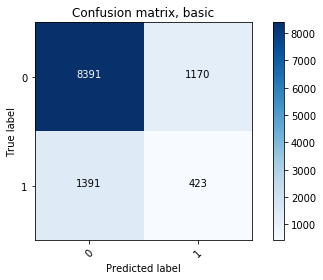

In [33]:
cm_basis = confusion_matrix(y_test, y_pred_FT)


np.set_printoptions(precision=2)

plt.figure()
plot_confusion_matrix(cm_basis, classes=['0','1'],
                      title='Confusion matrix, basic')
plt.show()

In [34]:
#labels = X.columns

#graph = Source(export_graphviz(clf, out_file=None
#   , feature_names=labels, class_names=['0', '1'] 
#   , filled = True))

#display(SVG(graph.pipe(format='svg')))

## DecisionTree with polynominal features

In [35]:
# get data
X, y = functions.get_data(type="__polynomial_new")
# split dataset into train and test data
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.33, random_state=10, stratify=y)

In [36]:
clf = DecisionTreeClassifier()
clf.fit(X_train, y_train.values.ravel())

DecisionTreeClassifier(class_weight=None, criterion='gini', max_depth=None,
            max_features=None, max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=1, min_samples_split=2,
            min_weight_fraction_leaf=0.0, presort=False, random_state=None,
            splitter='best')

In [37]:
# predict test values
y_pred_poly = clf.predict(X_test)

In [38]:
# calculate F1 score
f1_poly = f1_score(y_test, y_pred_poly)
"F1 score is = {0}".format(f1_poly)

'F1 score is = 0.25429940795038064'

In [39]:
# creating KNN instance
clf = DecisionTreeClassifier()
clfCV = GridSearchCV(clf, params, cv=10, scoring='recall', verbose=10, n_jobs=-1, refit=True)

clfCV.fit(X_train, y_train.values.ravel())

Fitting 10 folds for each of 3248 candidates, totalling 32480 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0342s.) Setting batch_size=10.
[Parallel(n_jobs=-1)]: Done   5 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done  28 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done  98 tasks      | elapsed:    0.6s
[Parallel(n_jobs=-1)]: Done 168 tasks      | elapsed:    1.0s
[Parallel(n_jobs=-1)]: Done 258 tasks      | elapsed:    1.4s
[Parallel(n_jobs=-1)]: Done 348 tasks      | elapsed:    1.8s
[Parallel(n_jobs=-1)]: Done 458 tasks      | elapsed:    2.6s
[Parallel(n_jobs=-1)]: Done 568 tasks      | elapsed:    3.6s
[Parallel(n_jobs=-1)]: Done 698 tasks      | elapsed:    4.4s
[Parallel(n_jobs=-1)]: Done 828 tasks      | elapsed:    5.2s
[Parallel(n_jobs=-1)]: Done 978 tasks      | elapsed:    6.1s
[Parallel(n_jobs=-1)]: Done 1128 tasks      | elapsed:    8.5s
[Parallel(n_jobs=-1)]: Done 1298 tasks      | elapsed:    9.7s
[Parallel(n_jobs=-1)]: Done 1468

[Parallel(n_jobs=-1)]: Done 19567 tasks      | elapsed: 11.2min
[Parallel(n_jobs=-1)]: Done 19821 tasks      | elapsed: 11.4min
[Parallel(n_jobs=-1)]: Done 20079 tasks      | elapsed: 11.6min
[Parallel(n_jobs=-1)]: Done 20337 tasks      | elapsed: 11.8min
[Parallel(n_jobs=-1)]: Done 20599 tasks      | elapsed: 11.9min
[Parallel(n_jobs=-1)]: Batch computation too slow (2.0045s.) Setting batch_size=1.
[Parallel(n_jobs=-1)]: Batch computation too fast (0.1999s.) Setting batch_size=2.
[Parallel(n_jobs=-1)]: Done 20786 tasks      | elapsed: 12.2min
[Parallel(n_jobs=-1)]: Done 21052 tasks      | elapsed: 12.3min
[Parallel(n_jobs=-1)]: Batch computation too slow (2.0431s.) Setting batch_size=1.
[Parallel(n_jobs=-1)]: Done 21266 tasks      | elapsed: 12.6min
[Parallel(n_jobs=-1)]: Batch computation too fast (0.1804s.) Setting batch_size=2.
[Parallel(n_jobs=-1)]: Done 21496 tasks      | elapsed: 12.7min
[Parallel(n_jobs=-1)]: Batch computation too slow (2.0230s.) Setting batch_size=1.
[Parallel

GridSearchCV(cv=10, error_score='raise-deprecating',
       estimator=DecisionTreeClassifier(class_weight=None, criterion='gini', max_depth=None,
            max_features=None, max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=1, min_samples_split=2,
            min_weight_fraction_leaf=0.0, presort=False, random_state=None,
            splitter='best'),
       fit_params=None, iid='warn', n_jobs=-1,
       param_grid={'splitter': ['best', 'random'], 'criterion': ['entropy'], 'max_depth': [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 20, 30, 40, 50, 60, 70, 80, 90, 100], 'min_samples_split': [2, 4, 6, 8, 10, 12, 14], 'max_features': ['auto', 'sqrt', 'log2', None]},
       pre_dispatch='2*n_jobs', refit=True, return_train_score='warn',
       scoring='recall', verbose=10)

In [40]:
clf = clfCV.best_estimator_
clf.fit(X_train, y_train.values.ravel())
# predict test values
y_pred_poly = clf.predict(X_test)

# calculate F1 score
f1_poly = f1_score(y_test, y_pred_poly)
print("F1 score is = {0}".format(f1_poly))
print("Accuracy is = {0}".format(accuracy_score(y_test, y_pred_poly)))

F1 score is = 0.28385637545942893
Accuracy is = 0.7773186813186813


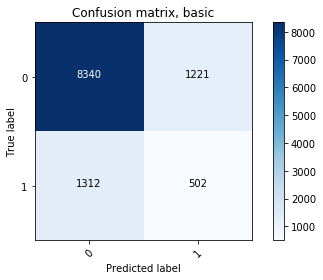

In [41]:
cm_basis = confusion_matrix(y_test, y_pred_poly)


np.set_printoptions(precision=2)

plt.figure()
plot_confusion_matrix(cm_basis, classes=['0','1'],
                      title='Confusion matrix, basic')
plt.show()

In [42]:
#labels = X.columns

#graph = Source(export_graphviz(clf, out_file=None
#   , feature_names=labels, class_names=['0', '1'] 
#   , filled = True))

#display(SVG(graph.pipe(format='svg')))